This notebook contains implementation of the original [Style Transfer paper](https://arxiv.org/abs/1508.06576).

Style transfer is the transfer of style of one image to another image.

In [0]:
 import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from skimage import io, transform
from PIL import Image


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# Download the VGG19 model
vgg19=torchvision.models.vgg19(pretrained=True).to(device)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth


In [0]:
# Replace max pool with average pool
# (as mentioned in paper)
for i,val in enumerate(vgg19.features):
    if type(val)==nn.MaxPool2d:
        vgg19.features[i]=nn.AvgPool2d(kernel_size=2, stride=2, padding=0, ceil_mode=False)
        
# Freeze all the layers
# (as we dont want to update the VGG19, only update the input image)
for param in vgg19.parameters():
    param.requires_grad = False

In [4]:
vgg19

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU(inplace=True)
    (18): AvgPool

In [0]:
# Get output at indices by passing x through model 
def get_output(x,model,content_ind,style_ind):
    content_out,style_out=[],[]
    for i,layer in enumerate(model.features):
        x=layer(x)
        if i in content_ind:
            content_out.append(x)
        if i in style_ind:
            style_out.append(x)
    return content_out[0], style_out

In [0]:
# Calculates gram matrix for list of activations A
# output shape at each index- no. of channels x no. of channels
def calc_gram(A):
    newA=[]
    for val in A:
        val=val.squeeze(0)
        val=val.view(val.size(0),-1)   # dim- c x (w*h)
        val=torch.mm(val,val.t())
        newA.append(val)
    return newA

In [0]:
# Calculates content loss(MSE) between F and P
# P-original image activations and F-generated image activations 
def content_loss(P,F):
    loss=torch.sum((P-F)**2)
    return 0.5*loss

# calculate style loss(MSE) for each layer and weigh them according to w
def style_loss(P,F,w):
    A=calc_gram(P)
    G=calc_gram(F)
    loss=0
    for i in range(len(P)):
        diff_loss=torch.sum((A[i]-G[i])**2)
        loss+=(diff_loss*w[i])/(P[i].size(-1)*P[i].size(1))**2       # Normalize by dimension 
    return 0.25*loss

# Calculate total loss by combining content loss and style loss
def total_loss(orig_cont, gen_cont, orig_style, gen_style, w, alpha, beta):
    return alpha*content_loss(orig_cont,gen_cont)+ beta*style_loss(orig_style,gen_style,w)

In [0]:
# Below are the utility functions 
# Change dim of x from (w,h,3)->(1,3,w,h) to easily pass through model 
def img_to_passable(x):
    x=x.permute((2,0,1))
    x=x.unsqueeze(0)
    return x


# Inverse of img_to_passable
# (1,3,w,h)->(w,h,3)
def passable_to_img(x):
    x=x.squeeze(0)
    x=x.permute((1,2,0))
    return x


def clip(x):
    x=passable_to_img(x.cpu())
    x=normalize(x,reverse=True)
    x.data.clamp_(0, 1)  
    x=normalize(x)
    x=img_to_passable(x)
    return x.cuda().requires_grad_()


# Normalizes x using mean and std
# dimension of x=(w,h,c)
# If reverse=False then normalize, if reverse=True then unnormalize
def normalize(x,mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225],reverse=False):
    mean=torch.tensor(mean)
    std=torch.tensor(std)
    if reverse:
        return x*std+mean
    else:
        return (x-mean)/std

In [0]:
loader = transforms.Compose([
    transforms.Resize((512,512)),  # scale imported image
    transforms.ToTensor()])        # transform PIL image to torch tensor

def load_image(name):
    image = Image.open(name)
    image = loader(image)
    return image.float().unsqueeze(0)

In [0]:
# Train the model 
def train(content_image, style_image, x, content_indices, style_indices,alpha, beta, w, model):
    content_image,style_image,x=list(map(lambda x: normalize(x).to(device), [content_image,style_image,x]))  # normalize the three images
    content_image,style_image,x=list(map(lambda x: img_to_passable(x), [content_image,style_image,x]))       # make the three images passable to model

    x.requires_grad=True             # we want to update the x so compute its gradients
    optimiser=optim.LBFGS([x])
    
    orig_content_act, _= get_output(content_image,model,content_indices,style_indices)
    _,orig_style_act = get_output(style_image,model,content_indices,style_indices)

    epochs=200
    for i in range(epochs):
        def closure():
            optimiser.zero_grad()
            cont,style=get_output(clip(x),model,content_indices,style_indices)
            loss=total_loss(orig_content_act,cont,orig_style_act,style,w,alpha,beta)
            loss.backward()
            return loss

        optimiser.step(closure)
        
        if i%10==0:
            print('Epoch:',i)
            y=x.squeeze(0)
            y=y.permute((1,2,0)).detach().cpu()
            y=normalize(y,reverse=True)
            y=y.numpy().clip(0,1)
            plt.figure(figsize=(7,7))
            plt.imshow(y)
            plt.show()
    return x

In [0]:
def style_transfer(content_image_path,style_image_path,alpha,beta):
    content_img=passable_to_img(load_image(content_image_path))
    style_img=passable_to_img(load_image(style_image_path))

    # Take first three channels of each image
    content_img=content_img[...,:3]
    style_img=style_img[...,:3]

    # generate random image which we update to get final output
    x=torch.rand(512,512,3)          

    # Paper used these indices for content and style representations
    content_indices={21:'conv4_2'}
    style_indices={0:'conv1_1', 5:'conv2_1',10:'conv3_1',19:'conv4_1',28:'conv5_1'}

    # Give equal weightage to loss of each style layer's loss   
    w=[0.2,0.2,0.2,0.2,0.2]

    output_image=train(content_img, style_img, x, content_indices, style_indices, alpha, beta, w, vgg19)
    return output_image

Enter the path of the images below-

Epoch: 0


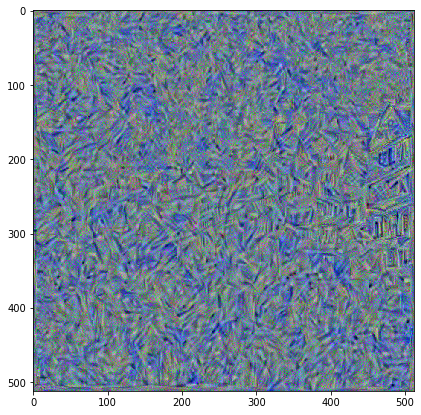

Epoch: 10


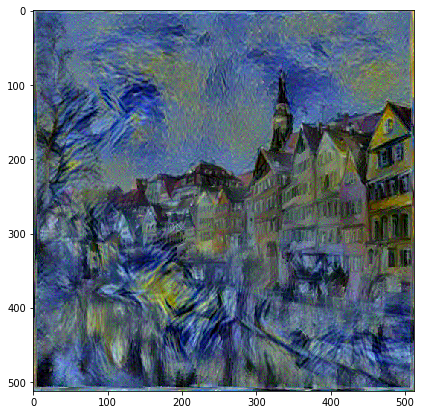

Epoch: 20


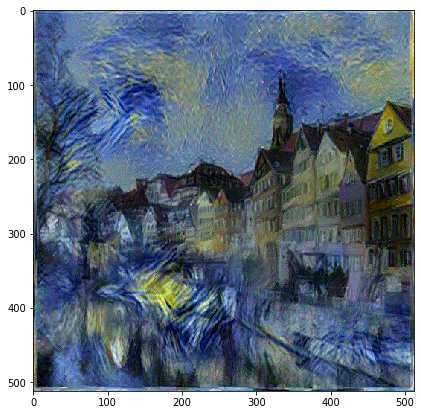

Epoch: 30


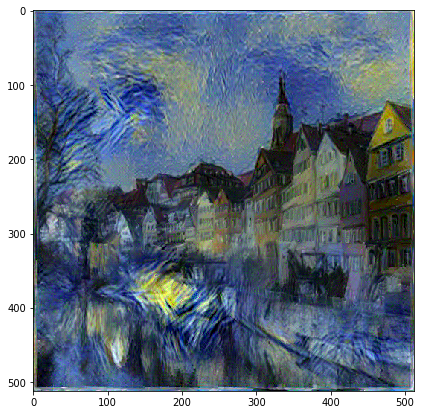

Epoch: 40


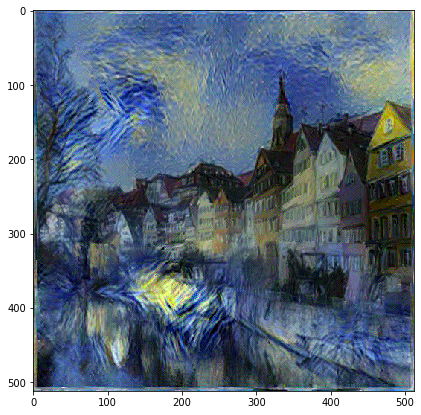

Epoch: 50


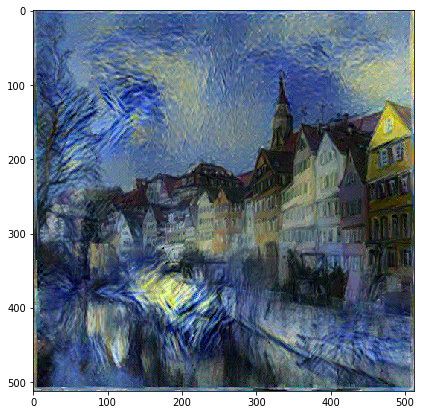

Epoch: 60


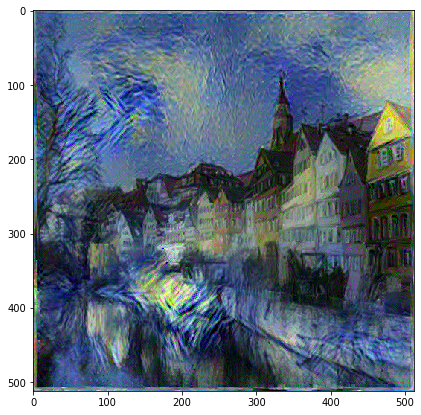

Epoch: 70


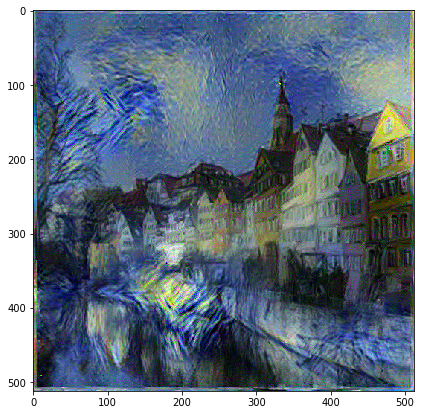

Epoch: 80


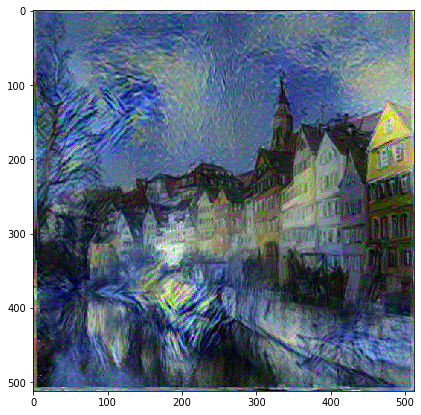

Epoch: 90


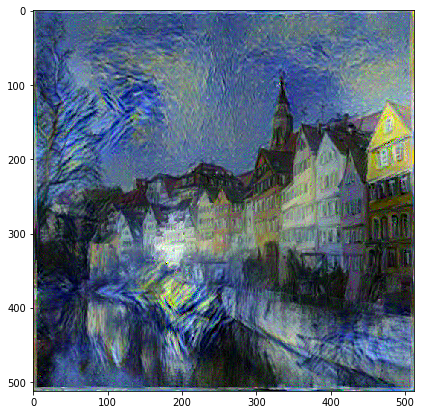

Epoch: 100


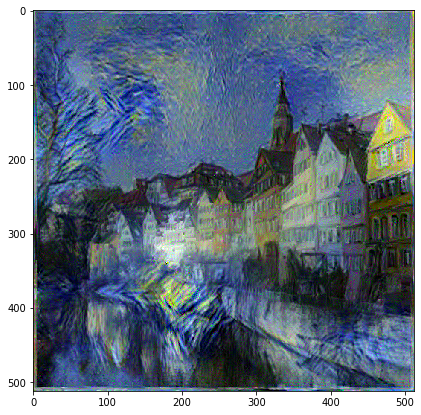

Epoch: 110


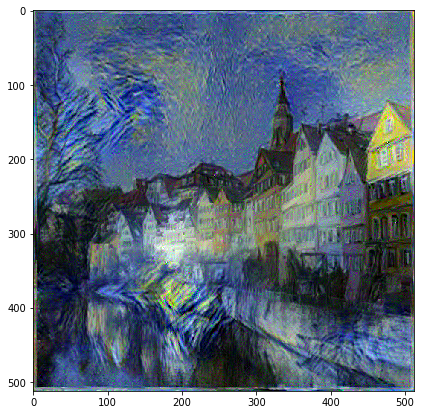

Epoch: 120


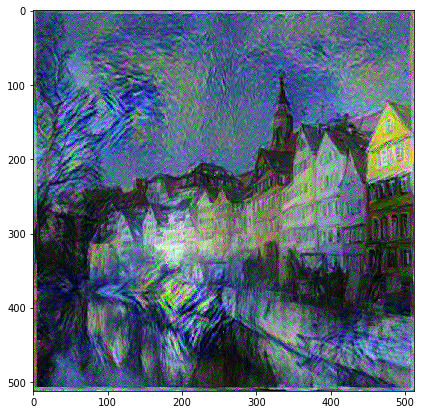

Epoch: 130


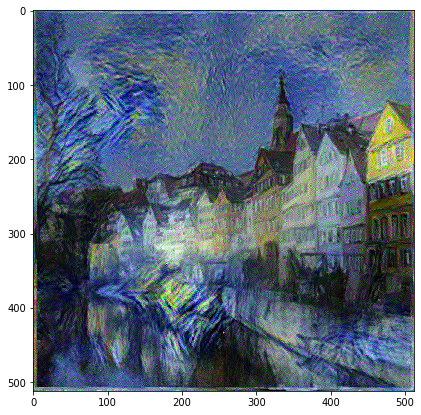

Epoch: 140


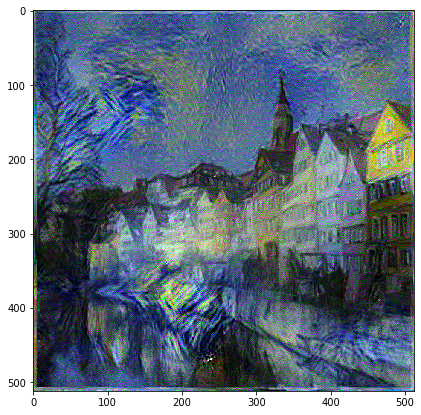

Epoch: 150


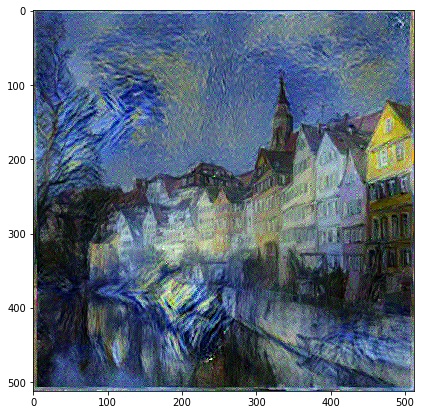

Epoch: 160


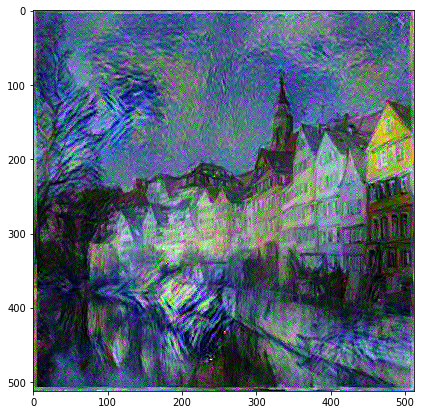

Epoch: 170


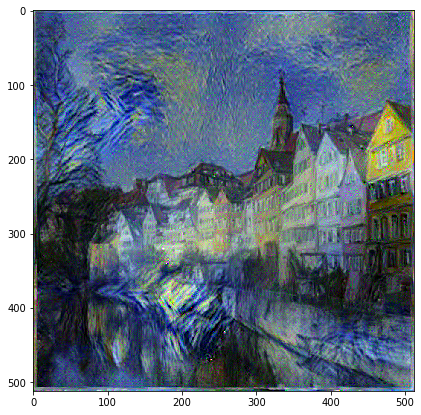

Epoch: 180


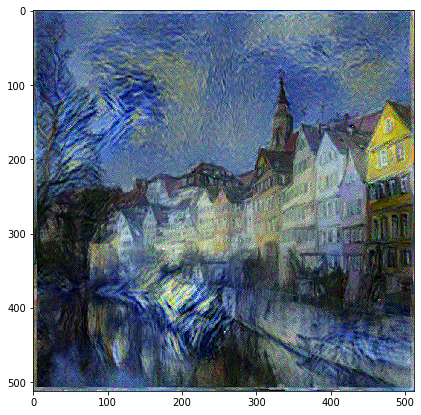

Epoch: 190


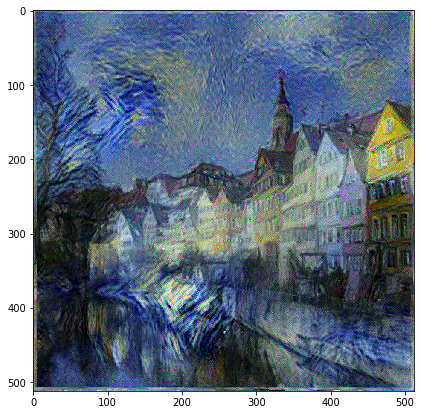

In [14]:
content_image_path='/content_image.png'
style_image_path='/style_image.png'

# weigh the content loss and style loss 
# (vary them to get different weightage of style and content)
alpha,beta=8,100000          

style_transfer_output=style_transfer(content_image_path,style_image_path,alpha,beta)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


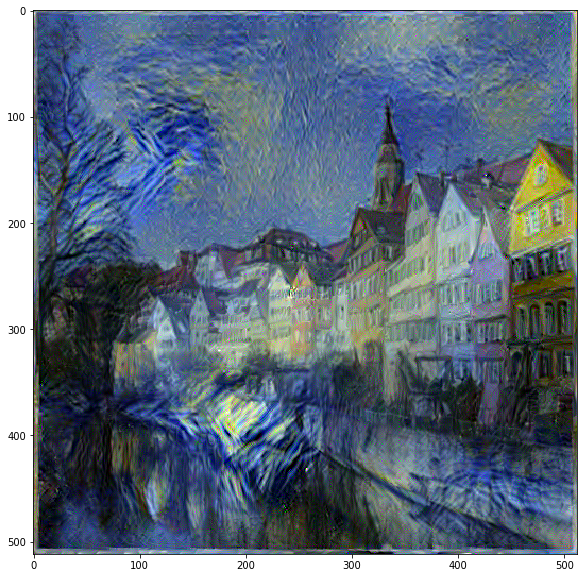

In [15]:
# Display the final image
plt.figure(figsize=(10,10))
y=style_transfer_output.squeeze(0)
y=y.permute((1,2,0)).detach().cpu()
y=normalize(y,reverse=True)
plt.imshow(y.numpy())
plt.show()

In [0]:
# Save the image
torchvision.utils.save_image(img_to_passable(y), 'style_transfer_output.png')